# Assignment 3: Explainable AI tools

The goal of this assignment is to learn how to generate explanations for machine learning model predictions. We will work with the German Credit dataset that we used in the previous assignment, and consider two popular explanation mechanisms-- LIME and SHAP-- for a couple of machine learning models.

This notebook has four stages in which we will:
1. Generate explanations for a learned logistic regression classifier using LIME.
2. Generate explanations for the same classifier using SHAP.
3. Compare the explanations generated by LIME and SHAP.
4. Explore LIME and SHAP for another classifier.

In [1]:
#!pip install shap==0.39.0
#!pip install lime

One of the major issues you might run into with this assignment is making shap and lime run on your current Python version. This assignment has been tested on Python 3.9-3.11, and runs as expected. **If you have a higher Python version, try deprecating to an older version, preferrably in a conda environment.**

As always, start early to resolve these issues.

In [2]:
%matplotlib inline

import sklearn
import sklearn.model_selection
import sklearn.metrics
import sklearn.datasets
import sklearn.ensemble
import sklearn.preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, KFold, cross_val_score

from IPython.display import Markdown, display, Image
import matplotlib.pyplot as plt
import warnings

import lime
import lime.lime_tabular
from lime import submodular_pick
# Downgrade numpy to a compatible version
#!pip install numpy==1.26.4
import shap
shap.initjs()

from IPython.core.display import HTML
import operator
from collections import defaultdict

import json
from collections import OrderedDict

import numpy as np
import pandas as pd

np.random.seed(1)

d:\Anaconda\envs\temp-env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Dataset

As in the previous assignments, we will work with the German Credit dataset, which is one of the most popular datasets in the XAI literature. (More information about the dataset can be found here: https://archive.ics.uci.edu/dataset/144/statlog+german+credit+data).

The task for this dataset is to predict whether an individual is a good credit risk or a bad credit risk.

In [3]:
cols = ['status', 'duration', 'credit_hist', 'purpose', 'credit_amt', 'savings', 'employment',\
            'install_rate', 'personal_status', 'debtors', 'residence', 'property', 'age', 'install_plans',\
            'housing', 'num_credits', 'job', 'num_liable', 'telephone', 'foreign_worker', 'credit']
data_df = pd.read_table('german.data', names=cols, sep=" ", index_col=False)
data_df['credit'] = data_df['credit'].replace(2, 0) #1 = Good, 2= Bad credit risk
y = data_df['credit']

print("Shape: ", data_df.shape)
data_df.head()

Shape:  (1000, 21)


,status,duration,credit_hist,purpose,credit_amt,savings,employment,install_rate,personal_status,debtors,...,property,age,install_plans,housing,num_credits,job,num_liable,telephone,foreign_worker,credit
0,A11,6,A34,A43,1169,A65,A75,4,A93,A101,...,A121,67,A143,A152,2,A173,1,A192,A201,1
1,A12,48,A32,A43,5951,A61,A73,2,A92,A101,...,A121,22,A143,A152,1,A173,1,A191,A201,0
2,A14,12,A34,A46,2096,A61,A74,2,A93,A101,...,A121,49,A143,A152,1,A172,2,A191,A201,1
3,A11,42,A32,A42,7882,A61,A74,2,A93,A103,...,A122,45,A143,A153,1,A173,2,A191,A201,1
4,A11,24,A33,A40,4870,A61,A73,3,A93,A101,...,A124,53,A143,A153,2,A173,2,A191,A201,0


In [4]:
# Get a list of feature names (excluding the outcome variable)
feature_names = data_df.columns[:-1]

### Data preprocessing

In this assignment, we will utilize sklearn's built-in encoders for data preprocessing:

In [5]:
# Label encoding
labels = data_df.iloc[:,-1]
le= sklearn.preprocessing.LabelEncoder()
le.fit(labels)
labels = le.transform(labels)
class_names = le.classes_
data = data_df.iloc[:,:-1]
le_label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Class names: ", class_names)
print("Label mapping: ", le_label_mapping)

Class names:  [0 1]
Label mapping:  {0: 0, 1: 1}


In [6]:
# Check if there are categorical varibles that we need to make dummies for
print(data.dtypes)

# Get a list of which variables are categorical
categorical_features  = [i for i in range(len(data.dtypes)) if data.dtypes[i]=='object']
print("Indices of categorical features: ", categorical_features)

status             object
duration            int64
credit_hist        object
purpose            object
credit_amt          int64
savings            object
employment         object
install_rate        int64
personal_status    object
debtors            object
residence           int64
property           object
age                 int64
install_plans      object
housing            object
num_credits         int64
job                object
num_liable          int64
telephone          object
foreign_worker     object
dtype: object
Indices of categorical features:  [0, 2, 3, 5, 6, 8, 9, 11, 13, 14, 16, 18, 19]


C:\Users\ldmag\AppData\Local\Temp\ipykernel_50908\2550768793.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  categorical_features  = [i for i in range(len(data.dtypes)) if data.dtypes[i]=='object']
C:\Users\ldmag\AppData\Local\Temp\ipykernel_50908\2550768793.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  categorical_features  = [i for i in range(len(data.dtypes)) if data.dtypes[i]=='object']
C:\Users\ldmag\AppData\Local\Temp\ipykernel_50908\2550768793.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consisten

Our explainers will require us to provide categorical features as a single column, not as dummies, so we cannot just explode these columns using one-hot encoding the way we normally would during pre-processing.

Instead, we will use some sklearn tools to take the following steps:
<ul>
<li>Encode the existing feature values with a number corresponding to each feature value.
<li>Make a dictionary storing the relationship between the original string feature value and the number we have replaced it with (categorical_names).
<li>Make a function that we can use later to transform categorical features into dummies.
</ul>

In [7]:
categorical_names = {}
for feature in categorical_features:
    print("Feature: ", feature)
    # Use label encoder to map categories to numbers
    le = sklearn.preprocessing.LabelEncoder()
    le.fit(data.iloc[:, feature])
    # Replace the feature values with corresponding numbers in the original data
    data.iloc[:, feature] = le.transform(data.iloc[:, feature])
    # Store and print the mappings for reference later
    categorical_names[feature] = le.classes_
    print(categorical_names[feature])
    print("==================================================")

# This variable stores the original names of each feature value for each feature
categorical_names

Feature:  0
['A11' 'A12' 'A13' 'A14']
Feature:  2
['A30' 'A31' 'A32' 'A33' 'A34']
Feature:  3
['A40' 'A41' 'A410' 'A42' 'A43' 'A44' 'A45' 'A46' 'A48' 'A49']
Feature:  5
['A61' 'A62' 'A63' 'A64' 'A65']
Feature:  6
['A71' 'A72' 'A73' 'A74' 'A75']
Feature:  8
['A91' 'A92' 'A93' 'A94']
Feature:  9
['A101' 'A102' 'A103']
Feature:  11
['A121' 'A122' 'A123' 'A124']
Feature:  13
['A141' 'A142' 'A143']
Feature:  14
['A151' 'A152' 'A153']
Feature:  16
['A171' 'A172' 'A173' 'A174']
Feature:  18
['A191' 'A192']
Feature:  19
['A201' 'A202']


{0: array(['A11', 'A12', 'A13', 'A14'], dtype=object),
 2: array(['A30', 'A31', 'A32', 'A33', 'A34'], dtype=object),
 3: array(['A40', 'A41', 'A410', 'A42', 'A43', 'A44', 'A45', 'A46', 'A48',
        'A49'], dtype=object),
 5: array(['A61', 'A62', 'A63', 'A64', 'A65'], dtype=object),
 6: array(['A71', 'A72', 'A73', 'A74', 'A75'], dtype=object),
 8: array(['A91', 'A92', 'A93', 'A94'], dtype=object),
 9: array(['A101', 'A102', 'A103'], dtype=object),
 11: array(['A121', 'A122', 'A123', 'A124'], dtype=object),
 13: array(['A141', 'A142', 'A143'], dtype=object),
 14: array(['A151', 'A152', 'A153'], dtype=object),
 16: array(['A171', 'A172', 'A173', 'A174'], dtype=object),
 18: array(['A191', 'A192'], dtype=object),
 19: array(['A201', 'A202'], dtype=object)}

In [8]:
# We will use the encoder function to transform the categorical columns into dummies--
# but we cannot do that to the original dataset if we want to use LIME
encoder = ColumnTransformer(transformers=[('get_dummies', OneHotEncoder(), categorical_features)], remainder='passthrough')
encoder = encoder.fit(data)

### Split the data into training and test subsets

In [9]:
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data, labels, train_size=0.80, random_state=10)
print("Train shape: ", train.shape)
print("Test shape: ", test.shape)

Train shape:  (800, 20)
Test shape:  (200, 20)


### Fit the model and make predictions

In [10]:
model = sklearn.linear_model.LogisticRegression(penalty="l2", C=0.1)
model.fit(train, labels_train)

# model predictions
pred_labels_test = model.predict((test))
print("Test set accuracy: ", sklearn.metrics.accuracy_score(labels_test, pred_labels_test))

Test set accuracy:  0.76


d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


 The prediction function `predict_fn` below, takes an instance and outputs prediction probabilities predicted by the learned model.

In [11]:
predict_fn = lambda x: model.predict_proba(x).astype(float)

## Section 1: LIME Explanations
We went over LIME (Local Interpretable Model-agnostic Explanations) in class. In this section, we will utilize the lime package to generate local and global explanations for a learned model.

### Generate the LIME explainer

LIME can be used for structured (tabular), unstructured (text) and image data. In this assignment, we will explore LIME's tabular explainers, which require a training set (as seen in the first parameter in the code below). The training data is used to create perturbed instances with which the learned model is probed.

In [12]:
explainer = lime.lime_tabular.LimeTabularExplainer(train.values,
                                                   feature_names=feature_names,
                                                   class_names=class_names,
                                                   categorical_features=categorical_features,
                                                   categorical_names=categorical_names)

### LIME's local explanations

We will now explain a single test instance by using LIME's explainer created above. Select the test instance to explain by setting `idx_to_explain` below. You can also select the maximum number of features that you want to see in the  explanation by setting the `num_features` parameter.

In [13]:
idx_to_explain = 0# index of the instance
print('Actual class: ', labels_test[idx_to_explain])

# Get explanation
exp = explainer.explain_instance((test.values[idx_to_explain]), predict_fn, num_features=5)

Actual class:  1


d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


### Visualize the explanation
Now that the explanation is ready, let's visualize it.

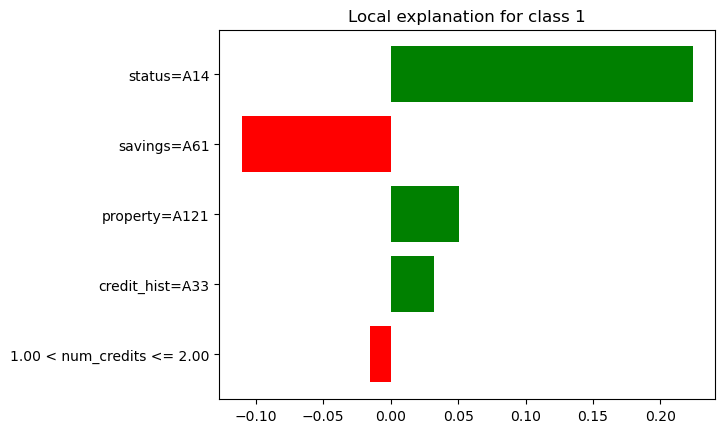

In [14]:
%matplotlib inline
fig = exp.as_pyplot_figure()

In [15]:
exp.show_in_notebook(show_all=True)

#### Q1. Explain the LIME output above. In this example, which features have the biggest impact?

**Your analysis here:**

The class predicted for index 0 (the first row) is estimated to be 1 with a confidence of about 85%. The explainer gives us three reasons for this prediction - one being the status variable, the property type, and credit history of the applicant. The biggest impact appears to come from the status value. Savings is also a consideration, but the explainer tells us that the value for savings is likely to influence whether it is classified as "0" instead.

You can also see the explanations as a list:

In [16]:
exp.as_list()

[('status=A14', 0.22388141300131859),
 ('savings=A61', -0.1104150783138135),
 ('property=A121', 0.050321884613159736),
 ('credit_hist=A33', 0.03215516410227585),
 ('1.00 < num_credits <= 2.00', -0.015570206740596853)]

In [17]:
# Explaining another prediction record
idx_to_explain = 10 # index of the instance
print('Actual class: ', labels_test[idx_to_explain])

# Get explanation
exp = explainer.explain_instance((test.values[idx_to_explain]), predict_fn, num_features=5)

Actual class:  1


d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


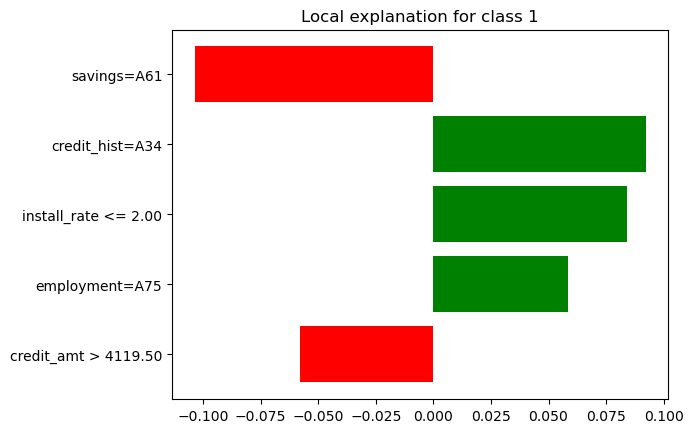

In [18]:
%matplotlib inline
fig = exp.as_pyplot_figure()

exp.show_in_notebook(show_all=True)

#### Q2. Select another test instance and explain its LIME prediction.Identify the features that have a positive and those that have a negative contribution toward the outcome.

**Your analysis here:**

For index 10, the findings are almost inverse. While the explainer says that the record at index 10 is "1" with 78% confidence, the features that influence this decision have changed. Savings and Status appears to have a negative contribution to the outcome, while Credit History, Installment rate, and Employment status has a positive effect towards the outcome.

### LIME' global explanations

As we just saw, explanations can vary a lot depending on what instance we pick. While this is great for explaining a single prediction, it makes it hard to give someone an intuition for "how the model makes decisions" in general.

That is where the **Submodular picker** comes in. It picks useful, representative examples that together give a **global explanation** for the model's behavior. (We briefly discussed submodular picker in class).

The algorithm generates global explanations using submodular picker in the following steps:
<ul>
    <li>Compute explanations for each of the examples in the dataset.</li>
    <li>The <i>coverage</i> step that we discussed in class determine which features are important in explaining a lot of the predictions i.e., features that seem <i>globally</i> important. The idea is to identify instances that cover a lot of the globally important features. </li>
    <li>The above is done by greedily selecting an example where the top globally important feature is part of the local explanation for that one example's prediction.</li>
    <li>Continue selecting examples until we have covered as many of the globally important features as possible, constrained by the number of features that the user wants returned (num_exps_desired).</li>
    </ul>

You can read the details of how this is done in the paper. More details on the function can be found here (https://lime-ml.readthedocs.io/en/latest/lime.html#lime-submodular-pick-module).

In [19]:
sp_obj = submodular_pick.SubmodularPick(explainer, train.values, predict_fn, sample_size=10,
                                        num_features=5, num_exps_desired=5)

d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
d:\Anacond

The sp_obj object contains the `num_exps_desired` explanation objects chosen by the submodular pick algorithm. Let's take a look at it:

In [20]:
sp_obj.V

[1, 0, 4, 9, 7]

Now for each of the chosen instance, let's see if the model predicted the correct label and the explanations generated for each of the instance.

In [21]:
for ind in sp_obj.V:
    exp = explainer.explain_instance(test.values[ind], predict_fn, num_features=5)
    print("Actual class: ", labels_test[ind])
    exp.show_in_notebook(show_all=False)
    print("==========================")

Actual class:  1


d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Actual class:  1


d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Actual class:  0


Actual class:  0


d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


d:\Anaconda\envs\temp-env\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Actual class:  0


#### Q3. Based on these chosen examples, what can you say about how the trained model makes decisions?

**Your analysis here:**

We see a specific value for credit history having a positive influence on the probability that the class is labelled "1" that is frequently occurring. In addition, a specific value for Status = A14 appears to have an effect on how probable class "1" would be predicted (A11 appears to skew it into negative direction}. Employment state and installment rate also appears to have some bearing on the outcome, but not to the same effect as the other variables. That being said, a credit loan will be denied by the model if the status of the checking account does not exist (or is 0), if the duration of the loan is greater than 2 years, and if the applicant has little to no savings in their account.

# Section 2: SHAP explanations

For the same learned model, let's explain the model predictions using the SHAP implementation (https://shap.readthedocs.io/en/latest/).

### Initialize the explainer

In [41]:
explainer = shap.LinearExplainer(model, train, feature_perturbation="interventional")
shap_values = explainer.shap_values(test)

d:\Anaconda\envs\temp-env\lib\site-packages\shap\explainers\_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


...and apply to test data.

C:\Users\ldmag\AppData\Local\Temp\ipykernel_50908\2849929854.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_array, feature_names=feature_names, plot_type='bar', max_display=30)


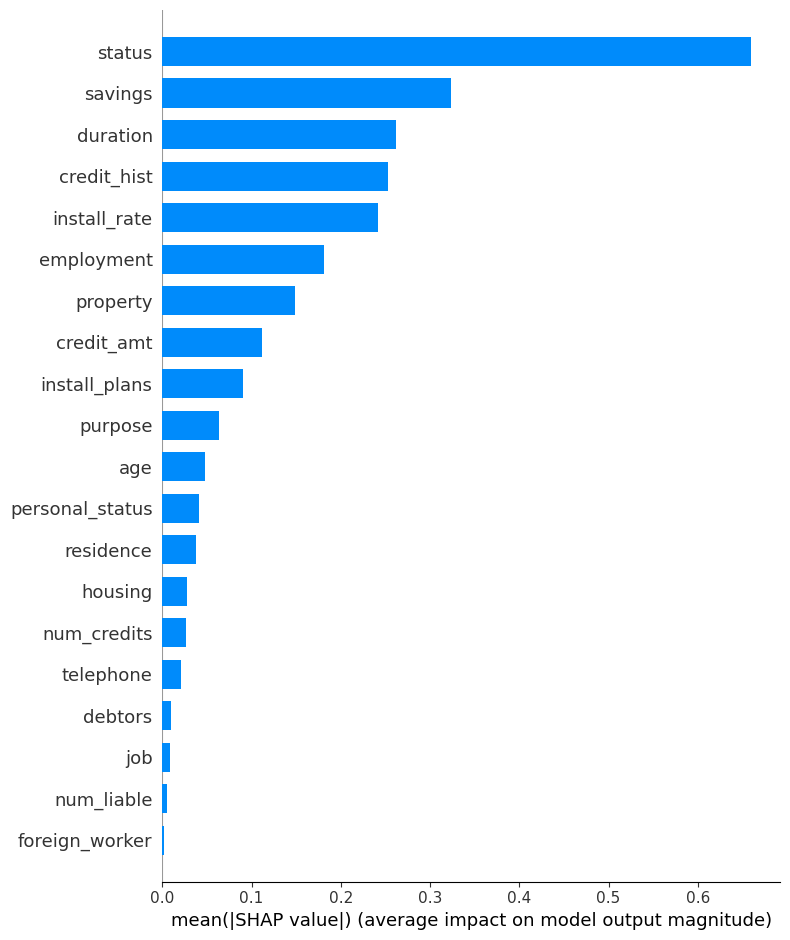

In [45]:
X_test_array = test.to_numpy() # We need to provide the data in dense format, not sparse
shap.summary_plot(shap_values, X_test_array, feature_names=feature_names, plot_type='bar', max_display=30)

Note: In case the summary_plot function does not work as it is, try including plot_type="bar", max_display=30 as additional arguments.


#### SHAP's local explanations

For the same test data instance that you chose in Section 1 above (`idx_to_explain`), generate SHAP's explanations

In [ ]:
shap.initjs()
print("Credit risk: Good" if labels_test[idx_to_explain] else "Credit risk: Bad")
print(test.iloc[idx_to_explain])
shap.force_plot(
    explainer.expected_value, shap_values[idx_to_explain,:], X_test_array[idx_to_explain,:],
    feature_names=feature_names
)

Credit risk: Good
status                1
duration             18
credit_hist           4
purpose               3
credit_amt         6361
savings               0
employment            4
install_rate          2
personal_status       2
debtors               0
residence             1
property              3
age                  41
install_plans         2
housing               1
num_credits           1
job                   2
num_liable            1
telephone             1
foreign_worker        0
Name: 659, dtype: object


#### Q4. Explain the SHAP output above. Which features have the highest contribution toward the outcome?

**Your analysis here:**

It appears for a "Good" credit risk classification - the variables indicating the number of installment plans, residence, duration of the loan, installment rate, employment type, and credit history appear to have a stronger influence over the outcome. 

We can also check the features that contribute to the positive and negative classes in the following manner. Check if what you obtain below is consistent with your observations in Q4.

In [47]:
# Checking features that contribute to the positive and negative classification of the instance
vals = shap_values[idx_to_explain,:]
positive_class_weight = defaultdict(float)
negative_class_weight = defaultdict(float)
feats = feature_names

for feat_i, val_i in zip(feats, vals):
  if val_i > 0:
    positive_class_weight[feat_i] += val_i
  elif val_i < 0:
    negative_class_weight[feat_i] += val_i

In [48]:
list(sorted(positive_class_weight.items(), key=operator.itemgetter(1), reverse=True))[:10]

[('credit_hist', 0.48200268155191583),
 ('employment', 0.279750768905689),
 ('install_rate', 0.1830051455613727),
 ('duration', 0.09030377668536273),
 ('residence', 0.07412025392707833),
 ('install_plans', 0.06765844750417091),
 ('telephone', 0.025121755888012867),
 ('age', 0.025105761841839987),
 ('personal_status', 0.02153981725028301),
 ('num_credits', 0.020256210568388135)]

In [49]:
list(sorted(negative_class_weight.items(), key=operator.itemgetter(1)))[:10]

[('property', -0.2939621525426709),
 ('savings', -0.24840326143809713),
 ('status', -0.22986004467161295),
 ('credit_amt', -0.15727161201059775),
 ('purpose', -0.01292326961837921),
 ('debtors', -0.005698274163122472),
 ('job', -0.0016530050975628215),
 ('foreign_worker', -0.0004956615217649591)]

In [ ]:
# This is for the cell below

idx_to_explain = 24 # index of the instance
print('Actual class: ', labels_test[idx_to_explain])

shap.initjs()
print("Credit risk: Good" if labels_test[idx_to_explain] else "Credit risk: Bad")
print(test.iloc[idx_to_explain])
shap.force_plot(
    explainer.expected_value, shap_values[idx_to_explain,:], X_test_array[idx_to_explain,:],
    feature_names=feature_names
)

Actual class:  0


Credit risk: Bad
status                1
duration             15
credit_hist           3
purpose               6
credit_amt         1512
savings               3
employment            2
install_rate          3
personal_status       3
debtors               0
residence             3
property              1
age                  61
install_plans         1
housing               1
num_credits           2
job                   2
num_liable            1
telephone             0
foreign_worker        0
Name: 449, dtype: object


#### Q5. Select another instance and explain its prediction using SHAP. Also, identify the features that have positive and those that have negative contribution toward the outcome.

**Your analysis here:**

For record with index 24, the variables indicating the purpose of the loan, personal status, credit amount, age, duration of loan, credit history, and savings status are what contribute the most to the designated outcome (Bad credit). This particular record has base values that are all greater than the base rate of 0.46, so no values appear to have a negative contribution toward the outcome. 

#### SHAP's Global explanations

We can use SHAP to identify features that the model deems important on the entire data by using the `shap.plots.bar()` function.



d:\Anaconda\envs\temp-env\lib\site-packages\shap\explainers\_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


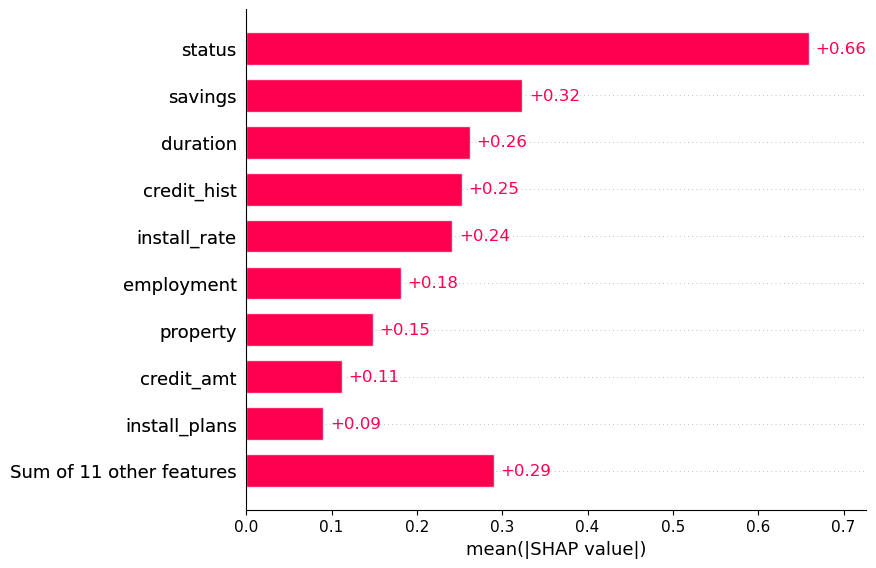

In [ ]:
# This throws an error if you don't use the explainer constructor itself in this version
explainer = shap.LinearExplainer(model, train, feature_perturbation="interventional")
shap_values = explainer(test)

shap.plots.bar(shap_values)

# shap.plots.bar(list(sorted(positive_class_weight.items(), key=operator.itemgetter(1), reverse=True))[:10])

#### Q6. Based on the above plot, what can you say about how the trained model makes decisions?

**Your analysis here:**

It appears that the model considers the variables of status and savings over other variables to make its decisions. While duration of loan, credit hostory, installment rate, employment, and property are also influencing the decision overall - status is a driving factor.

# Section 3: Comparing SHAP and LIME's explanations
In this section, you will compare the explanations generated by SHAP and LIME and comment on their agreement, ease of understanding and stability over different instances.

#### Q7. For the same instance (say, `idx_to_explain` above), how do the local explanations generated by SHAP compare to that of LIME?

**Your analysis here:**

#### Q8. Select another instance and compare the local explanations of LIME and SHAP. Do the explanations agree? Did you come across examples where the explanations did not agree with each other. In general, what can you comment about the stability of the explanations generated by the two methods?

**Your analysis here:**

#### Q9. How do the global explanations of SHAP compare with LIME's global explanations?

**Your analysis here:**

# Section 4: Generating explanations for a non-linear classifier

So far in this assignment, you have worked with logistic regression which is a linear classifier. In this section, we will explore SHAP and LIME for a non-linear model such as XGBoost, random forest classifiers or neural networks.  

#### Q10. Select a test instance to explain and compare the local explanations over its model predictions using SHAP and LIME.

**Your analysis here:**

#### Q11. Compare the global explanations for this model as generated by SHAP and LIME.

**Your analysis here:**

#### Q12. Provide a discussion of how well the two methods (SHAP and LIME) generalize to different models.

**Your analysis here:**

# Submitting this Assignment Notebook

Once complete, please submit your assignment notebook as an attachment under \"Assignments > Assignment 3\" on Brightspace. You can download a copy of your notebook using ```File > Download .ipynb```. Please ensure you submit the `.ipynb` file (and not a `.py` file)."